# Funciones

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from tqdm import tqdm

In [3]:
imgprueba = cv.imread('Foto100.jpg',0)
res = cv.resize(imgprueba, None, fx=0.03125, fy=0.03125, interpolation = cv.INTER_CUBIC)
nx = res.shape[1]
ny = res.shape[0]
channels = 3 #imgprueba.shape[2]
k_x = 2
k_y = 2

In [4]:
print(nx,ny)

171 114


In [5]:
def plot_single_image(image):
    #CLAVE, opencv carga en GBR y plt plotea en RGB
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    return

In [6]:
import os, os.path

def load(folder_name, num = 1):
    base = folder_name +"%d.jpg"
    print(base%num)
    images = []
    while os.path.isfile(base % num):
        images.append(cv.imread(base % num))
        num += 1
    return images

In [7]:
def load_gs(folder_name, num = 1):
    base = folder_name +"%d.jpg"
    print(base%num)
    images = []
    while os.path.isfile(base % num):
        original = cv.imread(base % num,0)
        res = cv.resize(original, None, fx=0.03125, fy=0.03125, interpolation = cv.INTER_CUBIC)
        images.append(res)
        num += 1
    return images

In [8]:
def create_EIA(images,k_x,k_y):
    ''' Entrada:
        images: list with images in order (see paper), each image of shape (ny,nx)
        k_x: number of elemental images in x axis
        k_y: number of elemental images in y axis
        Salida:
        EIA: Elemental Image Array, shape (nyk_y,nxk_x)
    '''
    indice = 2 #ya voy a gastar 2
    fila_1 = np.hstack((images[0],images[1]))
    first = True
    
    for x in range(2,k_x):
        fila_1 = np.hstack((fila_1,images[x]))
        indice = indice + 1
    for y in tqdm(range(k_y-1)): #ya forme una fila
        images_for_row = images[indice:indice+k_x]
        fila_i = np.hstack((images_for_row[0],images_for_row[1]))
        indice = indice + 2 
        for i in range(2,k_x):
            fila_i = np.hstack((fila_i,images_for_row[i]))
            indice = indice + 1
        if first:
            EIA = np.vstack((fila_1,fila_i))
            first = False
        else:
            EIA = np.vstack((EIA,fila_i))
    return EIA

In [9]:
def numerador(filas=30,columnas=0):
    """""
        Filas: cantidad de filas que quiero incluir
        Columnas: cantidad de columnas que quiero incluir
        Numeracion: array con la numeracion correspondiente
    """""
    inicio = np.array([0,29,30,59,60,89,90,119,120,149,150,179,180,209,210])
    suma = np.array([1,-1,1,-1,1,-1,1,-1,1,-1,1,-1,1,-1,1])
    if columnas !=0:
        inicio = inicio[:columnas]
        suma = suma[:columnas]
    segunda = inicio + suma
    numeracion = np.hstack((inicio,segunda))
    for i in range(filas-2):
        numeracion = np.hstack((numeracion,segunda + suma))
        segunda = segunda + suma
    return numeracion

In [10]:
def EIA_to_single_EIs(EIA,k_x,k_y,nx,ny):
    EIAs = []
    for i in range(k_y):
        for j in range(k_x):
            image = EIA[i*ny:i*ny+ny,j*nx:j*nx+nx]
            EIAs.append(image)
    return EIAs

In [11]:
def distances(template, ctex,ctey, img):
    """
    Funcion que devuelve la distancia entre la imagen original y la corrida 
    utilizando template matching
    Entradas: Template, endx de la imagen original, imagen corrida
    Salida: Distancia entre la imagen corrida y la original

    """
    #imageGray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    #templateGray = cv.cvtColor(template, cv.COLOR_BGR2GRAY)
    #Encuentro el sector de la imagen que mas matchea el template
    #Esta funcion devuelve una matriz con un 1 donde es mas probable que exista el match
    #Es mas probable en el sentido del coeficiente de correlacion normalizado, normalized correlation coefficient
    result = cv.matchTemplate(img, template,cv.TM_CCOEFF_NORMED)
    #Encuentro donde se dan los maximos y minimos
    (minVal, maxVal, minLoc, maxLoc) = cv.minMaxLoc(result)
    #Encuentro los limites del template en la imagen
    (startX, startY) = maxLoc
    endX = startX + template.shape[1]
    endY = startY + template.shape[0]
    distx = ctex - endX
    disty = ctey - endY
    return distx, disty

# Arreglo del EIA a algo periodico

In [12]:
def get_vector(images,template,c_x,c_y):
    x_s = np.zeros((c_y,c_x))
    y_s = np.zeros((c_y,c_x))
    contador = 0
    for i in range(c_y):
        for j in range(c_x):
            img_ = images[contador]
            result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
            (minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
            (startX0, startY0) = maxLoc0
            x_s[i,j] = startX0
            y_s[i,j] = startY0
            contador = contador + 1
    return x_s,y_s

In [13]:
numeracion = np.array([29,119,209,22,112,202,15,105,195])

In [14]:
img0 = cv.imread('Foto0.jpg',0)
img0 = cv.resize(img0, None, fx=0.03125, fy=0.03125, interpolation = cv.INTER_CUBIC)
imagenes_cargadas = load_gs('Foto')
imagenes = [img0] + imagenes_cargadas
imagenes_ord = []
for num_imagen in numeracion:
    imagenes_ord.append(imagenes[num_imagen])
del(imagenes)
del(imagenes_cargadas)

Foto1.jpg


In [15]:
template = cv.imread('template2.jpg',0)
template = cv.resize(template, None, fx=0.03125, fy=0.03125, interpolation = cv.INTER_CUBIC)

In [16]:
x_s,y_s = get_vector(imagenes_ord,template,3,3)

In [17]:
qs = np.arange(3)
ps = np.arange(3)
img_ = imagenes_ord[0]
lx = img_.shape[1]
ly = img_.shape[0]
result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
(minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
(startX0, startY0) = maxLoc0
x_m = startX0
y_m = startY0
P = ps.shape[0]
Q = qs.shape[0]

In [18]:
numerador_x = 0
numerador_y = 0
for p in range(P):
    for q in range(Q):
        numerador_x = numerador_x + p*(x_s[p,q]-x_m)
        numerador_y = numerador_y + q*(y_s[p,q]-y_m)

In [19]:
denominador_x = np.sum(p**2)*Q
denominador_y = np.sum(q**2)*P

In [20]:
Tx_ = numerador_x/denominador_x + lx
print(Tx_)
Tx = np.round(Tx_)
print(Tx)
Ty_ = numerador_y/denominador_y + ly
print(Ty_)
Ty = np.round(Ty_)
print(Ty)

185.5
186.0
107.0
107.0


In [21]:
#Creacion de matriz de xs periodica
#Primero creo el vector
#
x_aux = np.zeros(3)
x_aux[0] = x_m
for x in range(1,3):
    x_aux[x] = x_m + x*(Tx-lx)
X = x_aux
for i in range(1,3):
    X = np.vstack((X,x_aux))
print(X)

[[35. 50. 65.]
 [35. 50. 65.]
 [35. 50. 65.]]


In [22]:
#Cracion de matriz ys periodica
#Primero creo el vector
#
y_aux = np.zeros((3,1))
y_aux[0] = y_m
for y in range(1,3):
    y_aux[y] = y_m + y*(Ty-ly)
Y = y_aux
for i in range(1,3):
    Y = np.hstack((Y,y_aux))
print(Y)

[[59. 59. 59.]
 [52. 52. 52.]
 [45. 45. 45.]]


In [23]:
matriz = np.array([[29,119,209],
                   [22,112,202],
                   [15,105,195]])
img_ord = []
for p in range(3):
    for q in range(3):
        img = cv.imread('Foto'+ str(matriz[p,q])+'.jpg',0)
        img = cv.resize(img, None, fx=0.03125, fy=0.03125, interpolation = cv.INTER_CUBIC)
        result = cv.matchTemplate(img, template,cv.TM_CCOEFF_NORMED)
        (minVal, maxVal, minLoc, maxLoc) = cv.minMaxLoc(result)
        (startX, startY) = maxLoc
        distx = X[p,q] - startX
        disty = Y[p,q] - startY
        print(distx,disty)
        transition_matrix = np.float32([[1, 0, distx],
                                       [0, 1,disty]])
        h, w = img.shape[:2]
        img_transition = cv.warpAffine(img, transition_matrix, (w,h))
        cv.imwrite('3x3Trasladadas/Trasladada'+str(matriz[p,q])+'.jpg', img_transition)
        img_ord.append(img_transition)

0.0 0.0
-4.0 0.0
-9.0 0.0
0.0 2.0
-4.0 2.0
-9.0 2.0
0.0 5.0
-4.0 5.0
-9.0 5.0


100%|████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<?, ?it/s]


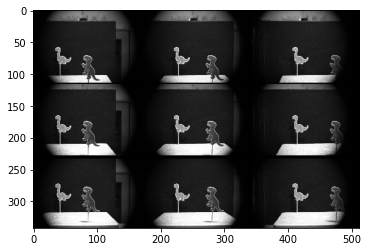

In [24]:
EIA_tot = create_EIA(img_ord,3,3)
plt.imshow(EIA_tot,cmap = 'gray')

# Filtrado

In [25]:
#Primero saquemos algunas constantes
#Tamaños originales de las imagenes
N1, M1 = EIA_tot.shape
#Llamaremos Ux y Uy al espaciado en el espacio de frecuencias
#Llamaremos M y N a los nuevos tamaños de imagen EIA necesarios para que Ux e Uy sean enteros
#Llamaremos Ux1 y Uy1 al espaciado entre frecuencias el la cual no se completa un periodo entero
Tx = Tx
Ty = Ty
Ux1 = M1/Tx
Ux = int(np.ceil(Ux1))
M = int(Ux*Tx)
Uy1 = N1/Ty
Uy = int(np.ceil(Uy1))
N = int(Uy*Ty)

In [26]:
#Creamos un cepillo de tamaño N*M 
cepillo1 = np.zeros((N,M))
cepillo1[::Uy,::Ux] = 1

In [27]:
#Hacemos el padding a la EIA original
c_filas = N-N1
c_columnas = M-M1
#Creo las columnas extras 
columnas = np.zeros((N1,c_columnas))
EIA_final = np.hstack((EIA_tot,columnas))
filas = np.zeros((c_filas,EIA_final.shape[1]))
EIA_final1 = np.vstack((EIA_final,filas))

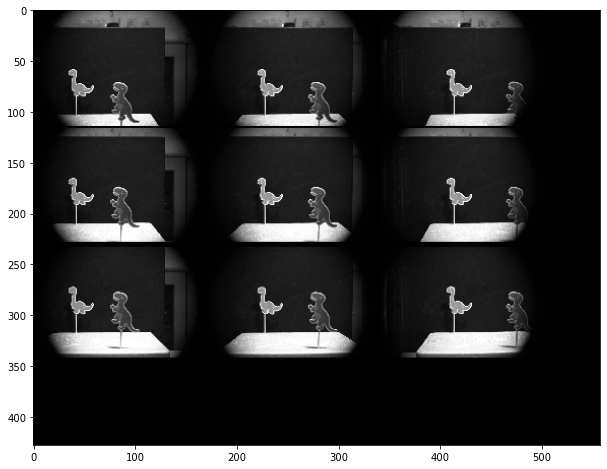

In [28]:
plt.figure(figsize = (16,8))
plt.imshow(EIA_final1,cmap = 'gray')

In [29]:
#Ahora hacemos l fft
F_EIA = np.fft.fft2(EIA_final1)
#Luego hacemos el filtrado
filtrado = F_EIA*cepillo1
#Luego hacemos la transformada inversa
EIA_filtrada = np.fft.ifft2(filtrado)
#Tomamos parte real
EIA_filtrada = np.real(EIA_filtrada)

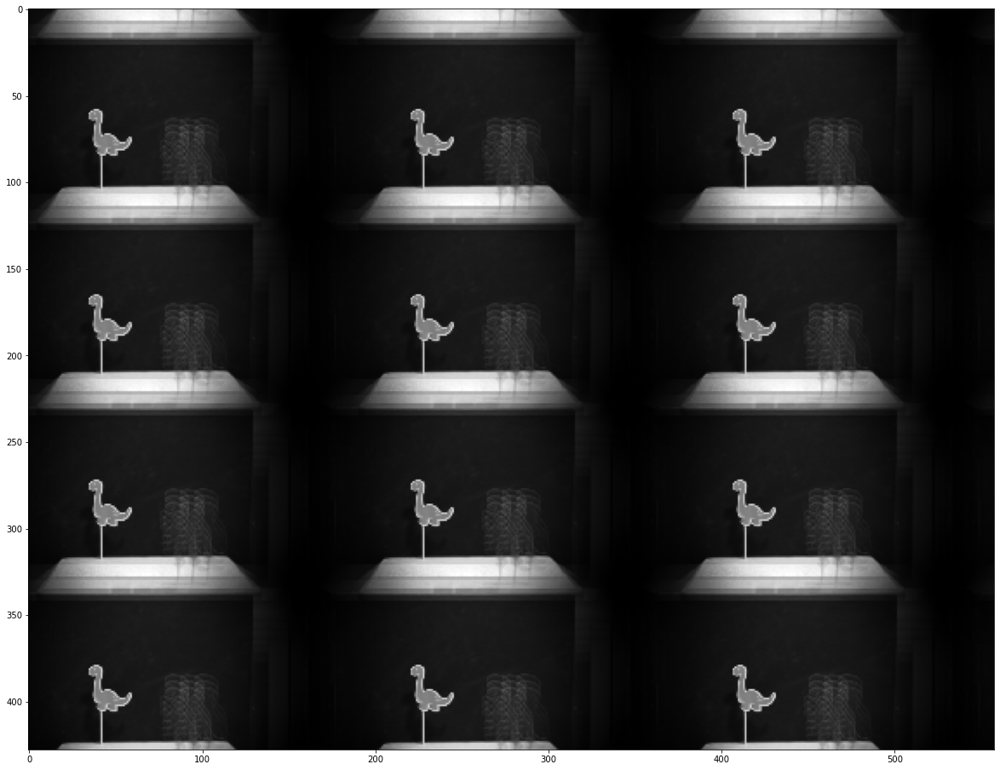

In [30]:
plt.figure(figsize = (32,16))
plt.imshow(EIA_filtrada,cmap = 'gray')

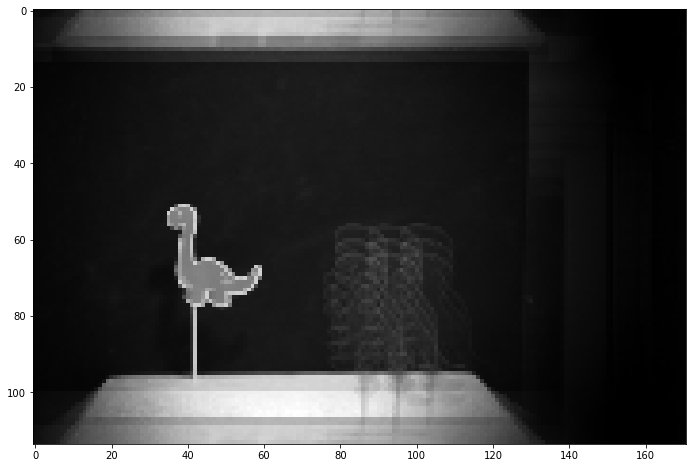

In [31]:
single_filtered = EIA_to_single_EIs(EIA_filtrada,3,3,nx,ny)
plt.figure(figsize = (16,8))
plt.imshow(single_filtered[3],cmap = 'gray')

# Dino verde

In [36]:
#Veamos el periodo del dino verde
img0 = cv.imread('3x3Trasladadas/Trasladada29.jpg',0)
#img0 = cv.resize(img0, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
template = cv.imread('3x3Trasladadas/template.jpg',0)
template = cv.resize(template, None, fx=0.03125, fy=0.03125, interpolation = cv.INTER_CUBIC)
img_abajo = cv.imread('3x3Trasladadas/Trasladada22.jpg',0)
#img_abajo = cv.resize(img_abajo, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
img_costado = cv.imread('3x3Trasladadas/Trasladada119.jpg',0)
#img_costado = cv.resize(img_costado, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)

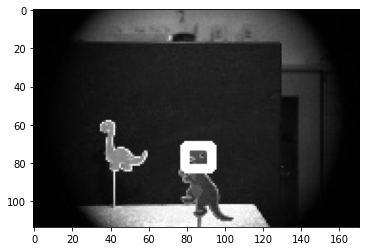

In [37]:
img_ = img0
result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
(minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
(startX0, startY0) = maxLoc0
endX0 = startX0 + template.shape[1]
endY0 = startY0 + template.shape[0]
cv.rectangle(img_, (startX0, startY0), (endX0, endY0), (255, 0, 0), 3)
# show the output image
plt.imshow(img_, cmap = 'gray')
X0_central = startX0
Y0_central = startY0

195


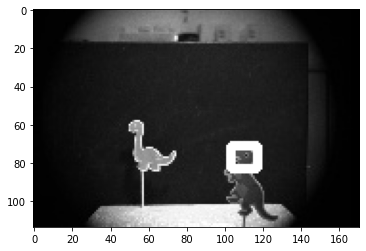

In [38]:
img_ = img_costado
result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
(minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
(startX0, startY0) = maxLoc0
endX0 = startX0 + template.shape[1]
endY0 = startY0 + template.shape[0]
cv.rectangle(img_, (startX0, startY0), (endX0, endY0), (255, 0, 0), 3)
# show the output image
plt.imshow(img_, cmap = 'gray')
X0_costado = startX0
Y0_costado = startY0
#Calculo de periodo horizontal
Tx2 = nx + X0_costado - X0_central
print(Tx2)

103


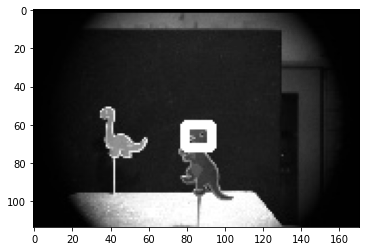

In [39]:
img_ = img_abajo
result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
(minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
(startX0, startY0) = maxLoc0
endX0 = startX0 + template.shape[1]
endY0 = startY0 + template.shape[0]
cv.rectangle(img_, (startX0, startY0), (endX0, endY0), (255, 0, 0), 3)
# show the output image
plt.imshow(img_, cmap = 'gray')
X0_abajo = startX0
Y0_abajo = startY0
#Periodo vertical
Ty2 = ny + Y0_abajo - Y0_central
print(Ty2)

In [40]:
#Primero saquemos algunas constantes
#Tamaños originales de las imagenes
N1, M1 = EIA_tot.shape
#Llamaremos Ux y Uy al espaciado en el espacio de frecuencias
#Llamaremos M y N a los nuevos tamaños de imagen EIA necesarios para que Ux e Uy sean enteros
#Llamaremos Ux1 y Uy1 al espaciado entre frecuencias el la cual no se completa un periodo entero
Tx2 = Tx2
Ty2 = Ty2
Ux1 = M1/Tx2
Ux = int(np.ceil(Ux1))
M = int(Ux*Tx2)
Uy1 = N1/Ty2
Uy = int(np.ceil(Uy1))
N = int(Uy*Ty2)

In [41]:
#Creamos un cepillo de tamaño N*M 
cepillo2 = np.zeros((N,M))
cepillo2[::Uy,::Ux] = 1

In [42]:
#Hacemos el padding a la EIA original
c_filas = N-N1
c_columnas = M-M1
#Creo las columnas extras 
columnas = np.zeros((N1,c_columnas))
EIA_final = np.hstack((EIA_tot,columnas))
filas = np.zeros((c_filas,EIA_final.shape[1]))
EIA_final2 = np.vstack((EIA_final,filas))

In [43]:
#Ahora hacemos l fft
F_EIA = np.fft.fft2(EIA_final2)
#Luego hacemos el filtrado
filtrado = F_EIA*cepillo2
#Luego hacemos la transformada inversa
EIA_filtrada = np.fft.ifft2(filtrado)
#Tomamos parte real
EIA_filtrada = np.real(EIA_filtrada)

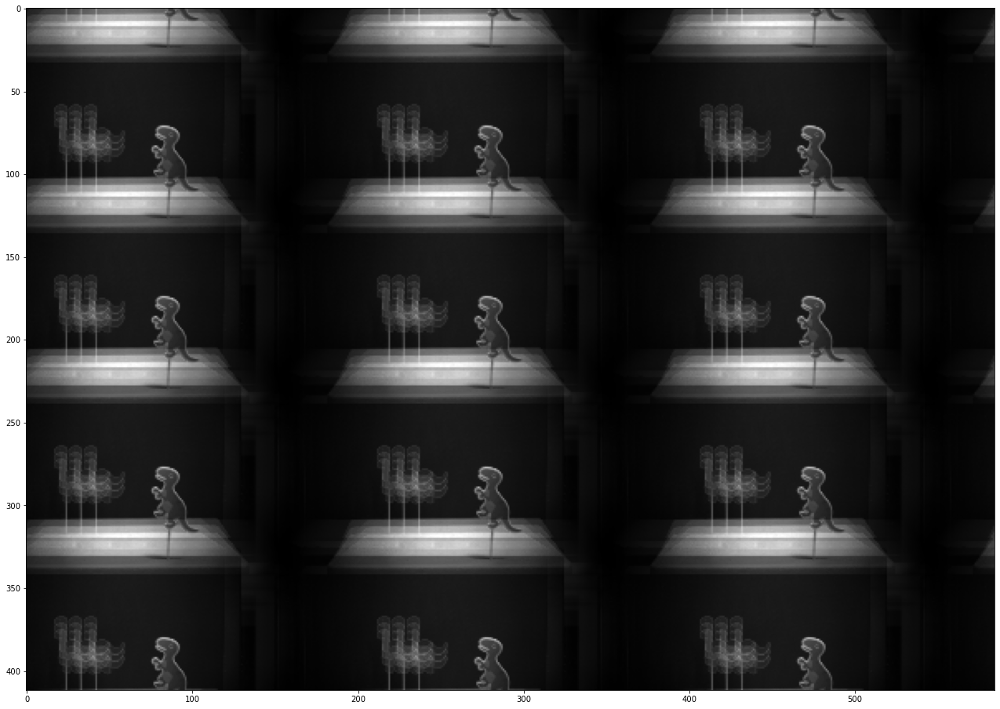

In [44]:
plt.figure(figsize = (32,16))
plt.imshow(EIA_filtrada,cmap = 'gray')

In [45]:
single_filtered = EIA_to_single_EIs(EIA_filtrada,3,3,nx,ny)

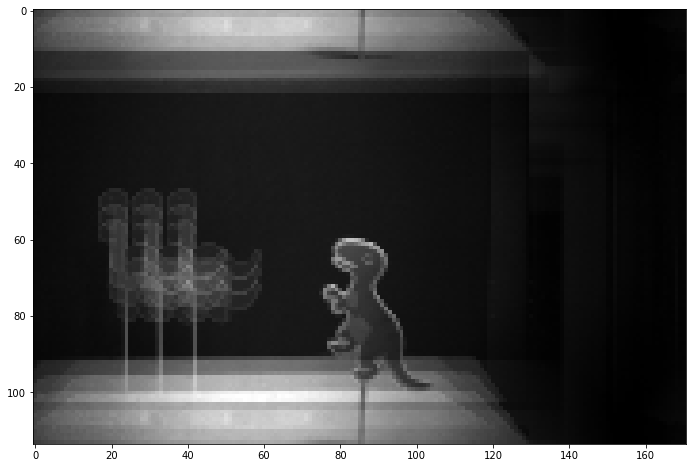

In [46]:
plt.figure(figsize = (16,8))
plt.imshow(single_filtered[3],cmap = 'gray')

In [203]:
for i in range(len(single_filtered)):
    cv.imwrite('3x3Trasladadas/Resultado'+ str(i) + '.jpg', single_filtered[i])

# Ambos dinos

In [47]:
def maximo_comun_divisor(a, b):
    temporal = 0
    while b != 0:
        temporal = b
        b = a % b
        a = temporal
    return a


def minimo_comun_multiplo(a, b):
    return (a * b) / maximo_comun_divisor(a, b)


In [48]:
del(imagenes_ord)
del(img_ord)
del(EIA_filtrada)
del(EIA_final)
del(EIA_final1)
del(EIA_final2)
del(single_filtered)

In [49]:
del(filtrado)

In [50]:
del(cepillo1)
del(cepillo2)

In [74]:
#Encontramos los pads necesarios
pad_x = np.ceil(EIA_tot.shape[1]/minimo_comun_multiplo(Tx,Tx2))*minimo_comun_multiplo(Tx,Tx2) - EIA_tot.shape[1]
pad_y = np.ceil(EIA_tot.shape[0]/minimo_comun_multiplo(Ty,Ty2))*minimo_comun_multiplo(Ty,Ty2) - EIA_tot.shape[0]
Lxn = int(EIA_tot.shape[1]+pad_x)
Lyn = int(EIA_tot.shape[0]+pad_y)
#Le hacemos el Padding a la imagen
EIA_final = np.zeros((Lyn,Lxn), dtype = np.uint8)
EIA_final[:EIA_tot.shape[0],:EIA_tot.shape[1]] = EIA_tot
#Ahora hacemos las redes en frecuencia
red1 = np.zeros((Lyn,Lxn), dtype = np.uint8)
Ux1 = int(EIA_tot.shape[1]/Tx)
Uy1 = int(EIA_tot.shape[0]/Ty)
red1[::Uy1,::Ux1] = 1
#red2 = np.zeros((Lyn,Lxn), dtype = np.uint8)
Ux2 = int(EIA_tot.shape[1]/Tx2)
Uy2 = int(EIA_tot.shape[0]/Ty2)
red1[::Uy2,::Ux2] = 1
#red = red1+red2
#Filtrado
#Ahora hacemos l fft
F_EIA = np.fft.fft2(EIA_final)
#Luego hacemos el filtrado
filtrado = F_EIA*(red1)
#Luego hacemos la transformada inversa
EIA_filtrada = np.fft.ifft2(filtrado)
#Tomamos parte real
EIA_filtrada = np.real(EIA_filtrada)

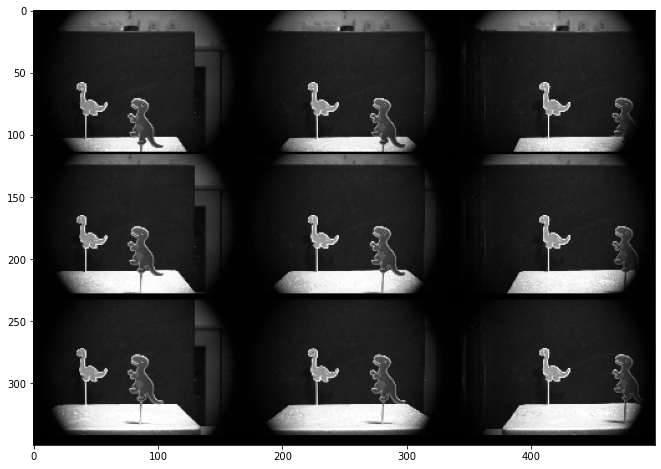

In [75]:
plt.figure(figsize = (16,8))
plt.imshow(EIA_filtrada[:350,:500],cmap = 'gray')

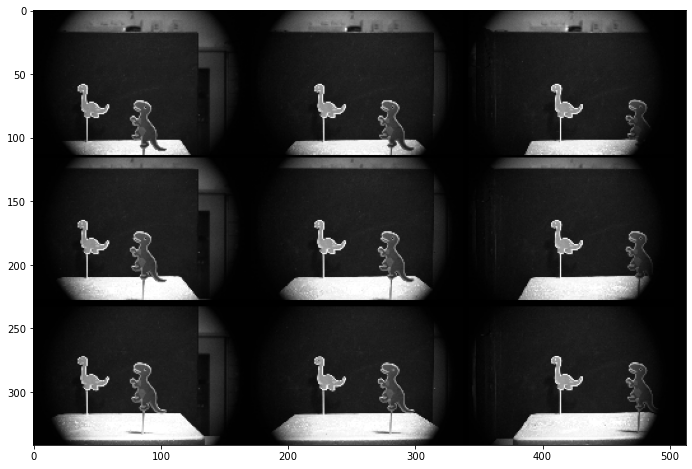

In [76]:
plt.figure(figsize = (16,8))
plt.imshow(EIA_tot,cmap = 'gray')

# Automatizacion final para todas las imagenes necesarias

In [51]:
def optimizacion(imagenes_ord,templtate,k_x,k_y,):
    #Encuentro la grilla original posiblemente no periodica
    x_s,y_s = get_vector(imagenes_ord,template,k_x,k_y)
    #Defino los vectores y constantes necesarias
    qs = np.arange(k_y)
    ps = np.arange(k_x)
    img_ = imagenes_ord[0]
    lx = img_.shape[1]
    ly = img_.shape[0]
    #Calculamos la posicion de la esquina
    result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
    (minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
    (startX0, startY0) = maxLoc0
    x_m = startX0
    y_m = startY0
    P = ps.shape[0]
    Q = qs.shape[0]
    numerador_x = 0
    numerador_y = 0
    #Calculamos los numeradores de la expresion del minimo
    for p in range(P):
        for q in range(Q):
            numerador_x = numerador_x + p*(x_s[p,q]-x_m)
            numerador_y = numerador_y + q*(y_s[p,q]-y_m)
    #Calculamos los denominadores de la expresion del minimo
    denominador_x = np.sum(p**2)*Q
    denominador_y = np.sum(q**2)*P
    #Calculamos periodos
    Tx_ = numerador_x/denominador_x + lx
    Tx = np.round(Tx_)
    Ty_ = numerador_y/denominador_y + ly
    Ty = np.round(Ty_)
    return Tx, Ty, x_m, y_m, lx, ly

In [52]:
def red_periodica(Tx,Ty,lx,ly,x_m,y_m,k_x,k_y):
    #Creacion de matriz de xs periodica
    #Primero creo el vector
    #
    x_aux = np.zeros(k_x)
    x_aux[0] = x_m
    for x in range(1,k_x):
        x_aux[x] = x_m + x*(Tx-lx)
    X = x_aux
    for i in range(1,k_x):
        X = np.vstack((X,x_aux))
    #Cracion de matriz ys periodica
    #Primero creo el vector
    #
    y_aux = np.zeros((k_y,1))
    y_aux[0] = y_m
    for y in range(1,k_y):
        y_aux[y] = y_m + y*(Ty-ly)
    Y = y_aux
    for i in range(1,k_y):
        Y = np.hstack((Y,y_aux))
    return X, Y

In [53]:
def periodizacion_general(template,matriz,X,Y,k_x,k_y):
    img_ord = []
    for p in range(k_x):
        for q in range(k_y):
            img = cv.imread('Foto'+ str(matriz[p,q])+'.jpg') #Sacar 0 cuando es en color
            img = cv.resize(img, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
            result = cv.matchTemplate(img, template,cv.TM_CCOEFF_NORMED)
            (minVal, maxVal, minLoc, maxLoc) = cv.minMaxLoc(result)
            (startX, startY) = maxLoc
            distx = X[p,q] - startX
            disty = Y[p,q] - startY
            transition_matrix = np.float32([[1, 0, distx],
                                           [0, 1,disty]])
            h, w = img.shape[:2]
            img_transition = cv.warpAffine(img, transition_matrix, (w,h))
            img_ord.append(img_transition)
            cv.imwrite('15x15Trasladadas/Foto'+ str(matriz[p,q])+'.jpg',img_transition)
    return img_ord

In [54]:
def frecuencia(EIA_tot,Tx,Ty):
    #Primero saquemos algunas constantes
    #Tamaños originales de las imagenes
    N1, M1 = EIA_tot.shape
    #Llamaremos Ux y Uy al espaciado en el espacio de frecuencias
    #Llamaremos M y N a los nuevos tamaños de imagen EIA necesarios para que Ux e Uy sean enteros
    #Llamaremos Ux1 y Uy1 al espaciado entre frecuencias el la cual no se completa un periodo entero
    Tx = Tx
    Ty = Ty
    Ux1 = M1/Tx
    Ux = int(np.ceil(Ux1))
    M = int(Ux*Tx)
    Uy1 = N1/Ty
    Uy = int(np.ceil(Uy1))
    N = int(Uy*Ty)
    #Creamos un cepillo de tamaño N*M 
    cepillo = np.zeros((N,M))
    cepillo[::Uy,::Ux] = 1
    #Hacemos el padding a la EIA original
    c_filas = N-N1
    c_columnas = M-M1
    #Creo las columnas extras 
    columnas = np.zeros((N1,c_columnas))
    EIA_final = np.hstack((EIA_tot,columnas))
    filas = np.zeros((c_filas,EIA_final.shape[1]))
    EIA_final = np.vstack((EIA_final,filas))
    #Ahora hacemos l fft
    F_EIA = np.fft.fft2(EIA_final)
    #Luego hacemos el filtrado
    filtrado = F_EIA*cepillo
    #Luego hacemos la transformada inversa
    EIA_filtrada = np.fft.ifft2(filtrado)
    #Tomamos parte real
    EIA_filtrada = np.real(EIA_filtrada)
    return EIA_filtrada

In [352]:
#Primera prueba, usar el pipeline para repetir lo que ya tengo
#Paso 1: Carga de imagenes y template
numeracion = np.array([29,119,209,22,112,202,15,105,195])
img0 = cv.imread('Foto0.jpg',0)
img0 = cv.resize(img0, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
imagenes_cargadas = load_gs('Foto')
imagenes = [img0] + imagenes_cargadas
imagenes_ord = []
for num_imagen in numeracion:
    imagenes_ord.append(imagenes[num_imagen])
del(imagenes)
del(imagenes_cargadas)
template = cv.imread('template2.jpg',0)
template = cv.resize(template, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)

Foto1.jpg


In [353]:
matriz = np.array([[29,119,209],
                   [22,112,202],
                   [15,105,195]])

100%|███████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 501.29it/s]


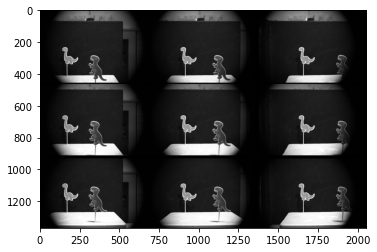

In [354]:
#Paso 2: Optimizacion
Tx,Ty, x_m, y_m ,lx, ly = optimizacion(imagenes_ord,template,3,3)
#Paso 3: Generar red periodica
X, Y = red_periodica(Tx,Ty,lx,ly,x_m,y_m,3,3)
#Paso 4: Ajustar nuestra red no periodica a esta nueva red periodica
img_ord = periodizacion_general(template,matriz,X,Y,3,3)
EIA_tot = create_EIA(img_ord,3,3)
plt.imshow(EIA_tot,cmap = 'gray')

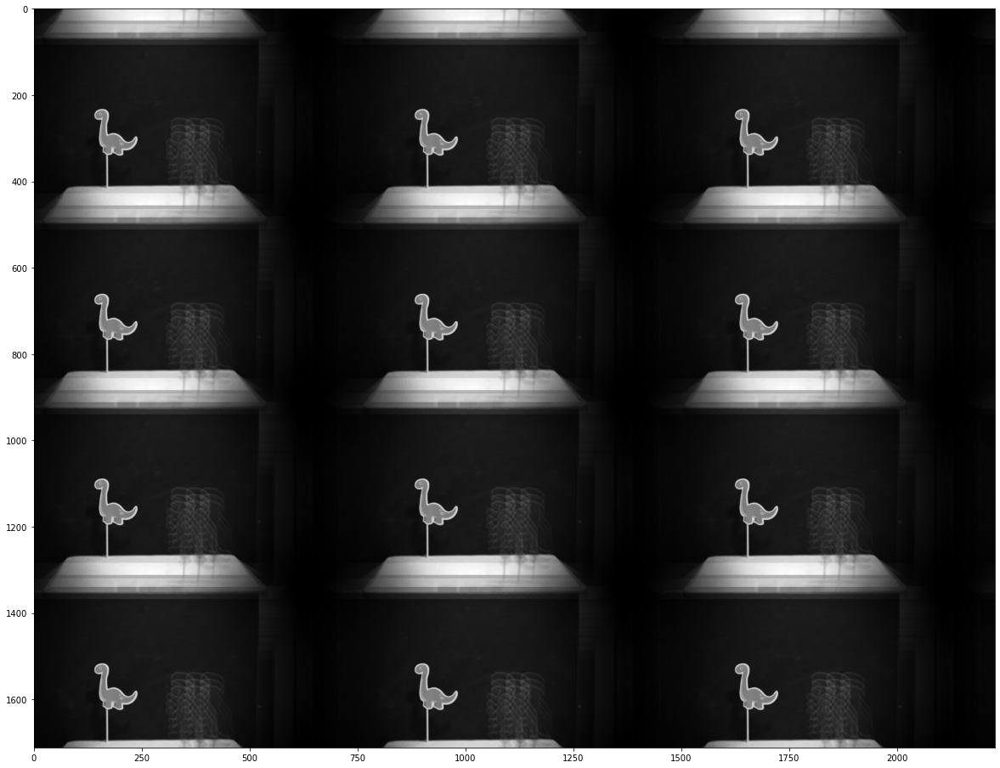

In [355]:
#Paso 3: Filtrar
EIA_filtrada = frecuencia(EIA_tot,Tx,Ty)
plt.figure(figsize = (32,16))
plt.imshow(EIA_filtrada,cmap = 'gray')

In [356]:
def numerador2(filas=30,columnas=0):
    """""
        Filas: cantidad de filas que quiero incluir
        Columnas: cantidad de columnas que quiero incluir
        Numeracion: array con la numeracion correspondiente
    """""
    inicio = np.array([0,29,30,59,60,89,90,119,120,149,150,179,180,209,210])
    suma = np.array([1,-1,1,-1,1,-1,1,-1,1,-1,1,-1,1,-1,1])
    if columnas !=0:
        inicio = inicio[:columnas]
        suma = suma[:columnas]
    segunda = inicio + suma
    numeracion = np.hstack((inicio,segunda))
    matriz = np.vstack((inicio,segunda))
    for i in range(filas-2):
        numeracion = np.hstack((numeracion,segunda + suma))
        matriz = np.vstack((matriz,segunda + suma))
        segunda = segunda + suma
    return numeracion, matriz

In [411]:
numeracion, matriz = numerador2(3,3)

In [412]:
print(matriz)

[[ 0 29 30 59 60]
 [ 1 28 31 58 61]
 [ 2 27 32 57 62]
 [ 3 26 33 56 63]
 [ 4 25 34 55 64]]


In [358]:
#Primera prueba, usar el pipeline para repetir lo que ya tengo
#Paso 1: Carga de imagenes y template
img0 = cv.imread('Foto0.jpg',0)
img0 = cv.resize(img0, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
imagenes_cargadas = load_gs('Foto')
imagenes = [img0] + imagenes_cargadas
imagenes_ord = []
for num_imagen in numeracion:
    imagenes_ord.append(imagenes[num_imagen])
del(imagenes)
del(imagenes_cargadas)
template = cv.imread('template2.jpg',0)
template = cv.resize(template, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)

Foto1.jpg


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 60.56it/s]


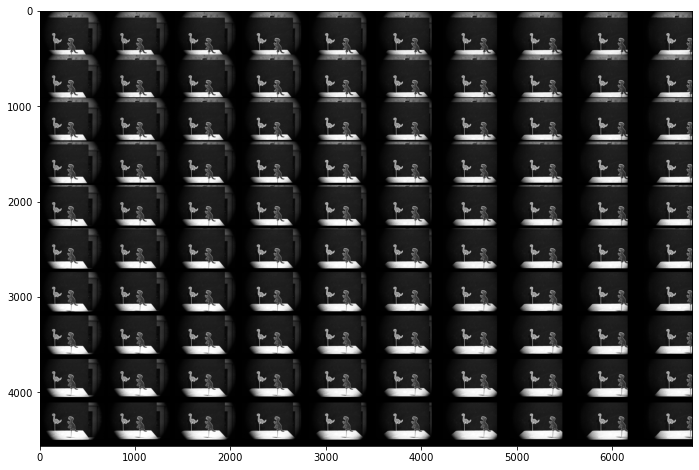

In [359]:
#Paso 2: Optimizacion
Tx,Ty, x_m, y_m ,lx, ly = optimizacion(imagenes_ord,template,10,10)
#Paso 3: Generar red periodica
X, Y = red_periodica(Tx,Ty,lx,ly,x_m,y_m,10,10)
#Paso 4: Ajustar nuestra red no periodica a esta nueva red periodica
img_ord = periodizacion_general(template,matriz,X,Y,10,10)
EIA_tot = create_EIA(img_ord,10,10)
plt.figure(figsize = (16,8))
plt.imshow(EIA_tot,cmap = 'gray')

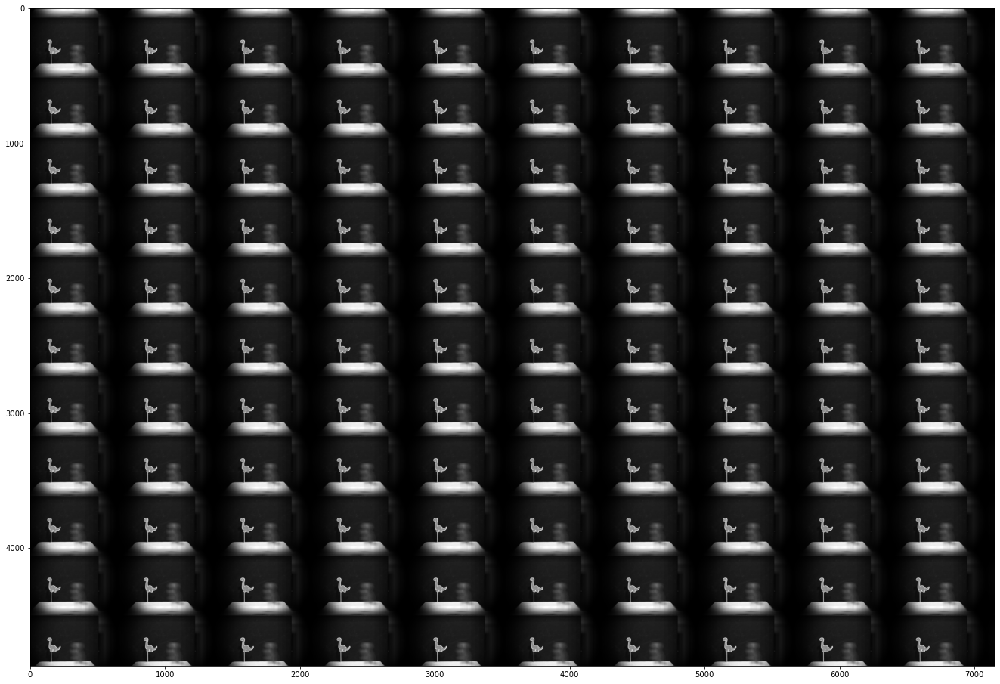

In [360]:
#Paso 3: Filtrar
EIA_filtrada = frecuencia(EIA_tot,Tx,Ty)
plt.figure(figsize = (32,16))
plt.imshow(EIA_filtrada,cmap = 'gray')

In [361]:
single_filtered = EIA_to_single_EIs(EIA_filtrada,10,10,nx,ny)

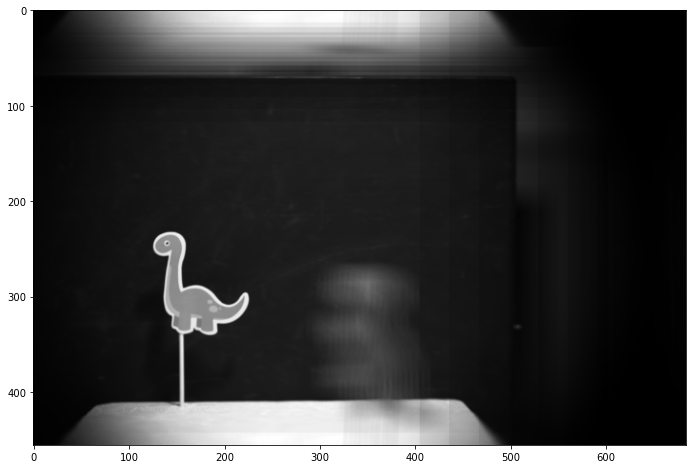

In [362]:
plt.figure(figsize = (16,8))
plt.imshow(single_filtered[0],cmap = 'gray')

In [46]:
cv.imwrite('single_poster.png',single_filtered[0])

True

# Color

In [57]:
def load_color(folder_name, num = 1):
    base = folder_name +"%d.jpg"
    print(base%num)
    images = []
    while os.path.isfile(base % num):
        original = cv.imread(base % num)
        res = cv.resize(original, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
        images.append(res)
        num += 1
    return images

In [58]:
matriz = np.array([[29,119,209],
                   [22,112,202],
                   [15,105,195]])
numeracion = np.array([29,119,209,22,112,202,15,105,195])

In [59]:
#Primera prueba, usar el pipeline para repetir lo que ya tengo
#Paso 1: Carga de imagenes y template
img0 = cv.imread('Foto0.jpg')
img0 = cv.resize(img0, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
imagenes_cargadas = load_color('Foto')
imagenes = [img0] + imagenes_cargadas
imagenes_ord = []
for num_imagen in numeracion:
    imagenes_ord.append(imagenes[num_imagen])
del(imagenes)
del(imagenes_cargadas)
template = cv.imread('template2.jpg')
template = cv.resize(template, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)

Foto1.jpg


100%|███████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 200.55it/s]


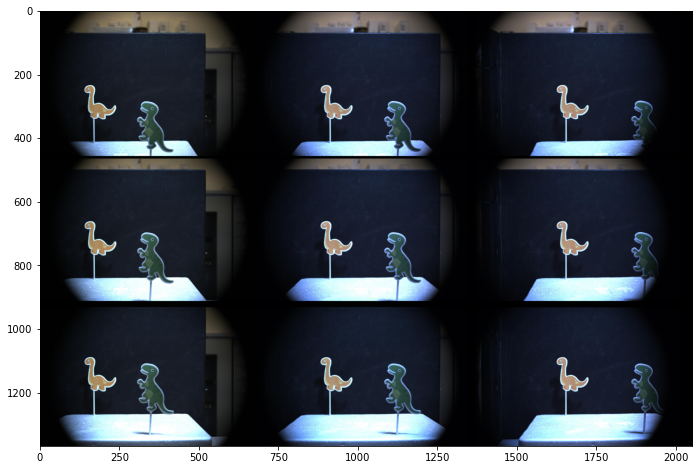

In [60]:
#Paso 2: Optimizacion
Tx,Ty, x_m, y_m ,lx, ly = optimizacion(imagenes_ord,template,3,3)
#Paso 3: Generar red periodica
X, Y = red_periodica(Tx,Ty,lx,ly,x_m,y_m,3,3)
#Paso 4: Ajustar nuestra red no periodica a esta nueva red periodica
img_ord = periodizacion_general(template,matriz,X,Y,3,3)
EIA_tot = create_EIA(img_ord,3,3)
plt.figure(figsize = (16,8))
plt.imshow(cv.cvtColor(EIA_tot, cv.COLOR_BGR2RGB))

In [61]:
B = EIA_tot[:,:,0]
G = EIA_tot[:,:,1]
R = EIA_tot[:,:,2]

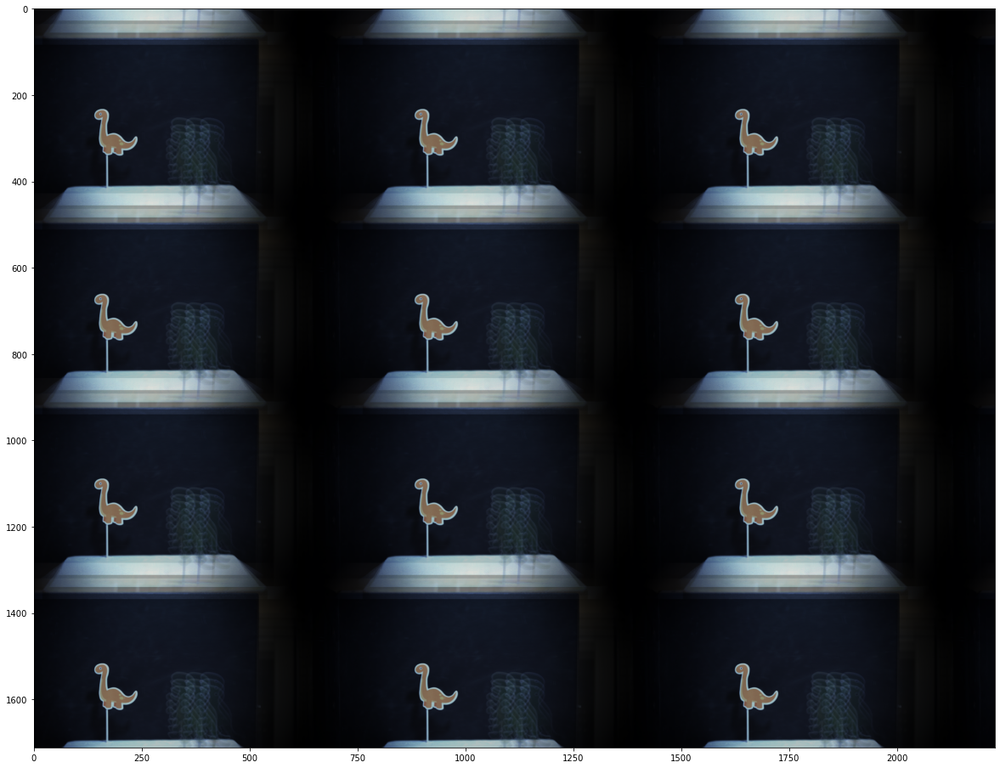

In [62]:
#Paso 3: Filtrar
B_filtrada = frecuencia(B,Tx,Ty)
G_filtrada = frecuencia(G,Tx,Ty)
R_filtrada = frecuencia(R,Tx,Ty)
EIA_filtrada = np.zeros((B_filtrada.shape[0],B_filtrada.shape[1],3),np.uint8)
EIA_filtrada[:,:,0] = R_filtrada
EIA_filtrada[:,:,1] = G_filtrada
EIA_filtrada[:,:,2] = B_filtrada
plt.figure(figsize = (32,16))
plt.imshow(EIA_filtrada,cmap = 'gray')

In [63]:
single_filtered = EIA_to_single_EIs(EIA_filtrada,3,3,nx,ny)

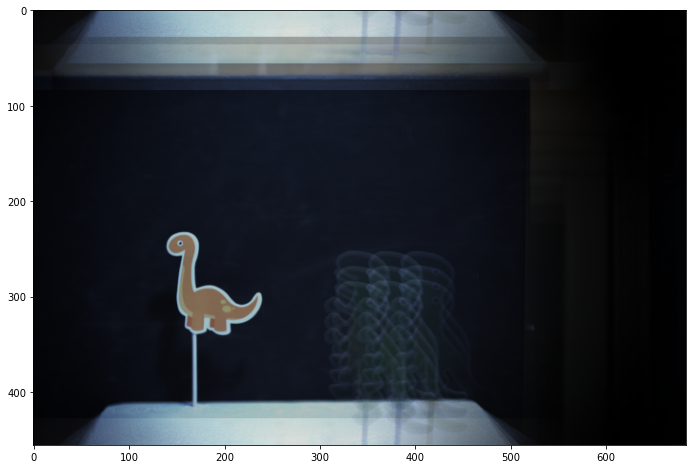

In [64]:
plt.figure(figsize = (16,8))
plt.imshow(single_filtered[0],cmap = 'gray')

In [448]:
cv.imwrite('single_poster_color.png',cv.cvtColor(single_filtered[4] , cv.COLOR_RGB2BGR))

True

In [62]:
cv.imwrite('full_poster_color.png',cv.cvtColor(EIA_filtrada , cv.COLOR_RGB2BGR))

True

In [66]:
for i in range(len(single_filtered)):
    cv.imwrite('3x3Trasladadas/ResultadoColor'+ str(i) + '.jpg', cv.cvtColor(single_filtered[i] , cv.COLOR_RGB2BGR))

# Color en segundo dino

In [434]:
#Veamos el periodo del dino verde
img0 = cv.imread('15x15Trasladadas/Foto29.jpg')
#img0 = cv.resize(img0, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
template = cv.imread('15x15Trasladadas/template.jpg')
template = cv.resize(template, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
img_abajo = cv.imread('15x15Trasladadas/Foto22.jpg')
#img_abajo = cv.resize(img_abajo, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
img_costado = cv.imread('15x15Trasladadas/Foto119.jpg')
#img_costado = cv.resize(img_costado, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)

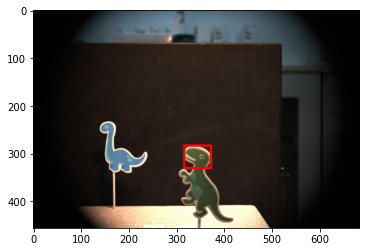

In [435]:
img_ = img0
result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
(minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
(startX0, startY0) = maxLoc0
endX0 = startX0 + template.shape[1]
endY0 = startY0 + template.shape[0]
cv.rectangle(img_, (startX0, startY0), (endX0, endY0), (255, 0, 0), 3)
# show the output image
plt.imshow(img_, cmap = 'gray')
X0_central = startX0
Y0_central = startY0

776


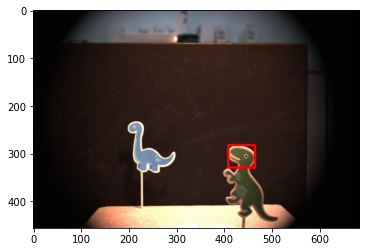

In [436]:
img_ = img_costado
result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
(minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
(startX0, startY0) = maxLoc0
endX0 = startX0 + template.shape[1]
endY0 = startY0 + template.shape[0]
cv.rectangle(img_, (startX0, startY0), (endX0, endY0), (255, 0, 0), 3)
# show the output image
plt.imshow(img_, cmap = 'gray')
X0_costado = startX0
Y0_costado = startY0
#Calculo de periodo horizontal
Tx2 = nx + X0_costado - X0_central
print(Tx2)

412


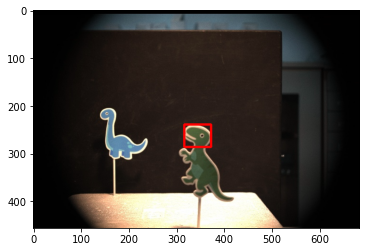

In [437]:
img_ = img_abajo
result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
(minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
(startX0, startY0) = maxLoc0
endX0 = startX0 + template.shape[1]
endY0 = startY0 + template.shape[0]
cv.rectangle(img_, (startX0, startY0), (endX0, endY0), (255, 0, 0), 3)
# show the output image
plt.imshow(img_, cmap = 'gray')
X0_abajo = startX0
Y0_abajo = startY0
#Periodo vertical
Ty2 = ny + Y0_abajo - Y0_central
print(Ty2)

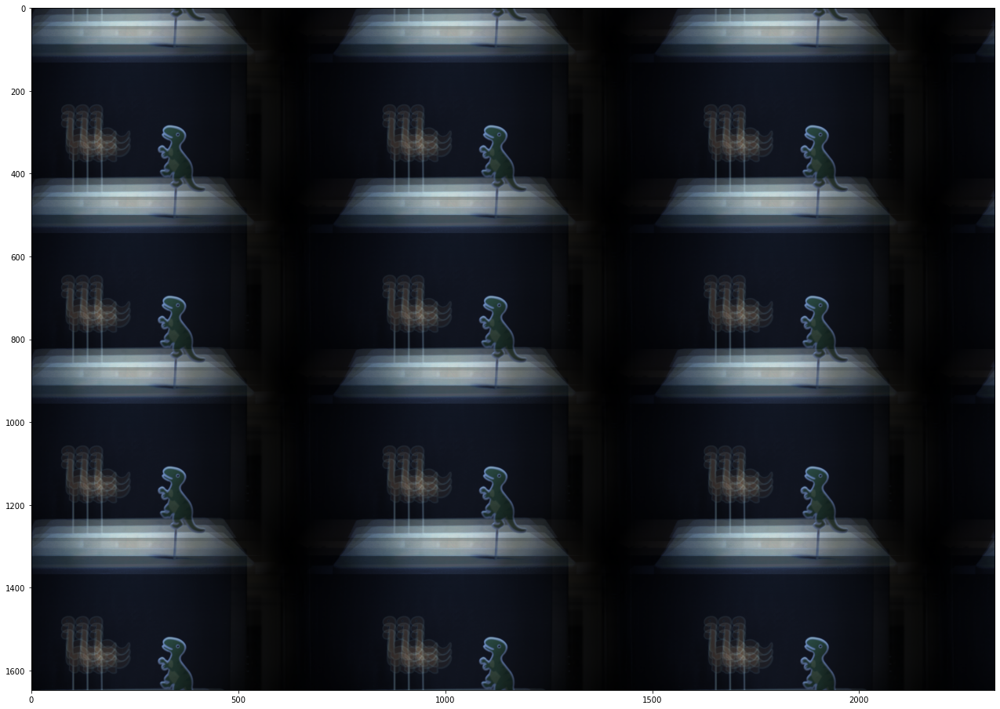

In [449]:
#Paso 3: Filtrar
B_filtrada = frecuencia(B,Tx2,Ty2)
G_filtrada = frecuencia(G,Tx2,Ty2)
R_filtrada = frecuencia(R,Tx2,Ty2)
EIA_filtrada = np.zeros((B_filtrada.shape[0],B_filtrada.shape[1],3),np.uint8)
EIA_filtrada[:,:,0] = R_filtrada
EIA_filtrada[:,:,1] = G_filtrada
EIA_filtrada[:,:,2] = B_filtrada
plt.figure(figsize = (32,16))
plt.imshow(EIA_filtrada,cmap = 'gray')

In [450]:
single_filtered = EIA_to_single_EIs(EIA_filtrada,3,3,nx,ny)

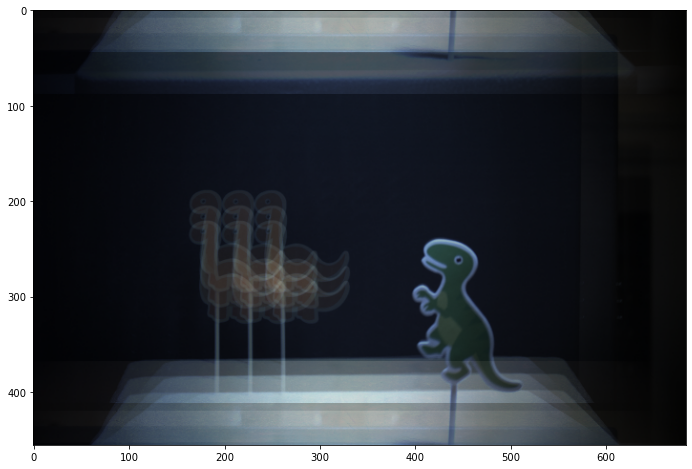

In [451]:
plt.figure(figsize = (16,8))
plt.imshow(single_filtered[4],cmap = 'gray')

In [452]:
cv.imwrite('single_poster_colordinoverde.png',cv.cvtColor(single_filtered[4] , cv.COLOR_RGB2BGR))

True

In [ ]:
for i in range(len(single_filtered)):
    cv.imwrite('3x3Trasladadas/ResultadoColor'+ str(i) + '.jpg', single_filtered[i])

# Rectificacion mirando dino adelante 7x7

In [453]:
#Primera prueba, usar el pipeline para repetir lo que ya tengo
numeracion, matriz = numerador2(7,7)
#Paso 1: Carga de imagenes y template
img0 = cv.imread('Foto0.jpg')
img0 = cv.resize(img0, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
imagenes_cargadas = load_color('Foto')
imagenes = [img0] + imagenes_cargadas
imagenes_ord = []
for num_imagen in numeracion:
    imagenes_ord.append(imagenes[num_imagen])
del(imagenes)
del(imagenes_cargadas)
template = cv.imread('template2.jpg')
template = cv.resize(template, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)

Foto1.jpg


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 39.07it/s]


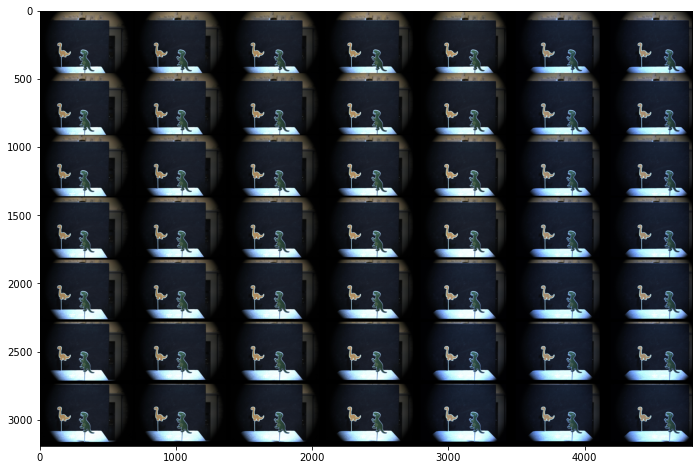

In [454]:
template = cv.imread('15x15Trasladadas/template.jpg')
template = cv.resize(template, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
#Paso 2: Optimizacion
Tx,Ty, x_m, y_m ,lx, ly = optimizacion(imagenes_ord,template,7,7)
#Paso 3: Generar red periodica
X, Y = red_periodica(Tx,Ty,lx,ly,x_m,y_m,7,7)
#Paso 4: Ajustar nuestra red no periodica a esta nueva red periodica
img_ord = periodizacion_general(template,matriz,X,Y,7,7)
EIA_tot = create_EIA(img_ord,7,7)
plt.figure(figsize = (16,8))
plt.imshow(cv.cvtColor(EIA_tot, cv.COLOR_BGR2RGB))

In [457]:
B = EIA_tot[:,:,0]
G = EIA_tot[:,:,1]
R = EIA_tot[:,:,2]

In [466]:
print(Tx,Ty)

715.0 443.0


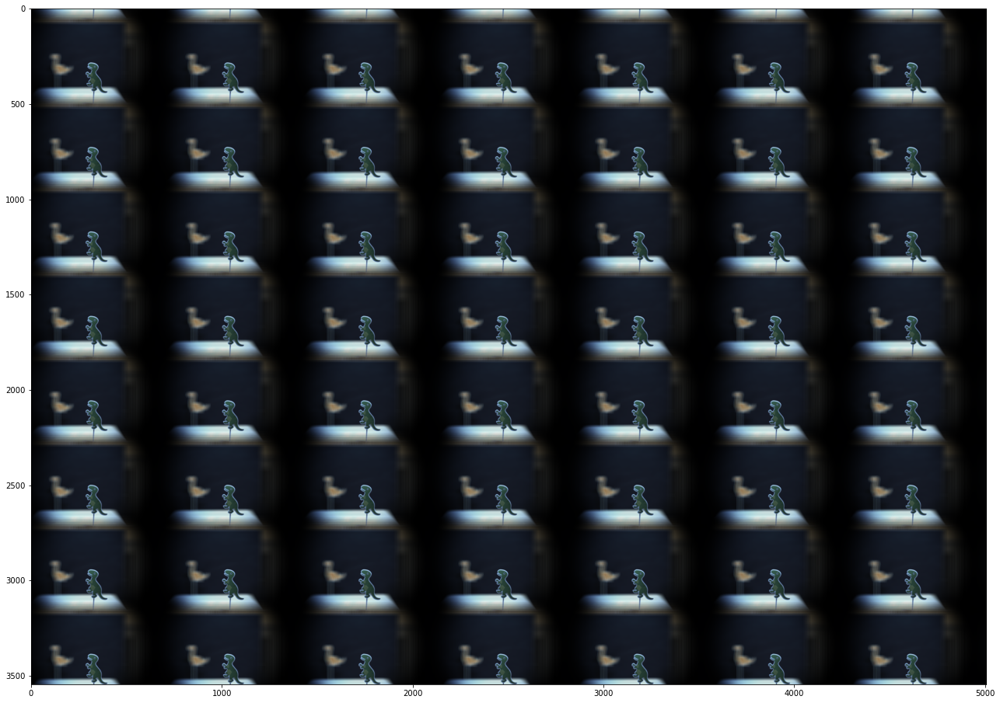

In [458]:
#Paso 3: Filtrar
B_filtrada = frecuencia(B,Tx,Ty)
G_filtrada = frecuencia(G,Tx,Ty)
R_filtrada = frecuencia(R,Tx,Ty)
EIA_filtrada = np.zeros((B_filtrada.shape[0],B_filtrada.shape[1],3),np.uint8)
EIA_filtrada[:,:,0] = R_filtrada
EIA_filtrada[:,:,1] = G_filtrada
EIA_filtrada[:,:,2] = B_filtrada
plt.figure(figsize = (32,16))
plt.imshow(EIA_filtrada,cmap = 'gray')

In [459]:
single_filtered = EIA_to_single_EIs(EIA_filtrada,7,7,nx,ny)

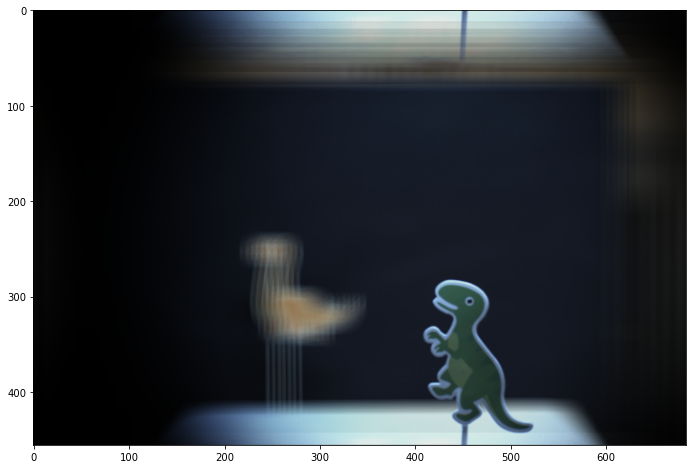

In [460]:
plt.figure(figsize = (16,8))
plt.imshow(single_filtered[4],cmap = 'gray')

In [467]:
#Veamos el periodo del dino verde
img0 = cv.imread('15x15Trasladadas/Foto0.jpg')
#img0 = cv.resize(img0, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
template = cv.imread('template2.jpg')
template = cv.resize(template, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
img_abajo = cv.imread('15x15Trasladadas/Foto1.jpg')
#img_abajo = cv.resize(img_abajo, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)
img_costado = cv.imread('15x15Trasladadas/Foto29.jpg')
#img_costado = cv.resize(img_costado, None, fx=0.125, fy=0.125, interpolation = cv.INTER_CUBIC)

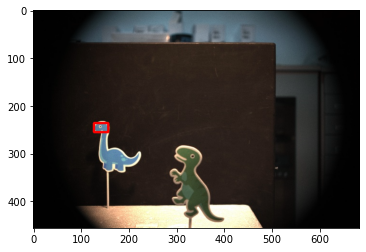

In [468]:
img_ = img0
result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
(minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
(startX0, startY0) = maxLoc0
endX0 = startX0 + template.shape[1]
endY0 = startY0 + template.shape[0]
cv.rectangle(img_, (startX0, startY0), (endX0, endY0), (255, 0, 0), 3)
# show the output image
plt.imshow(img_, cmap = 'gray')
X0_central = startX0
Y0_central = startY0

709


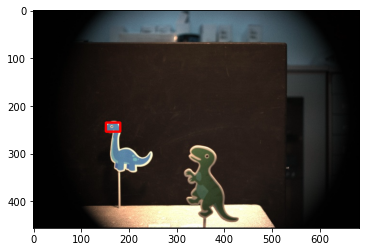

In [469]:
img_ = img_costado
result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
(minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
(startX0, startY0) = maxLoc0
endX0 = startX0 + template.shape[1]
endY0 = startY0 + template.shape[0]
cv.rectangle(img_, (startX0, startY0), (endX0, endY0), (255, 0, 0), 3)
# show the output image
plt.imshow(img_, cmap = 'gray')
X0_costado = startX0
Y0_costado = startY0
#Calculo de periodo horizontal
Tx2 = nx + X0_costado - X0_central
print(Tx2)

444


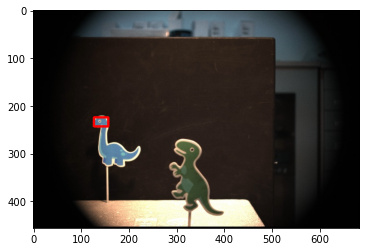

In [470]:
img_ = img_abajo
result0 = cv.matchTemplate(img_, template,cv.TM_CCOEFF_NORMED)
(minVal0, maxVal0, minLoc0, maxLoc0) = cv.minMaxLoc(result0)
(startX0, startY0) = maxLoc0
endX0 = startX0 + template.shape[1]
endY0 = startY0 + template.shape[0]
cv.rectangle(img_, (startX0, startY0), (endX0, endY0), (255, 0, 0), 3)
# show the output image
plt.imshow(img_, cmap = 'gray')
X0_abajo = startX0
Y0_abajo = startY0
#Periodo vertical
Ty2 = ny + Y0_abajo - Y0_central
print(Ty2)

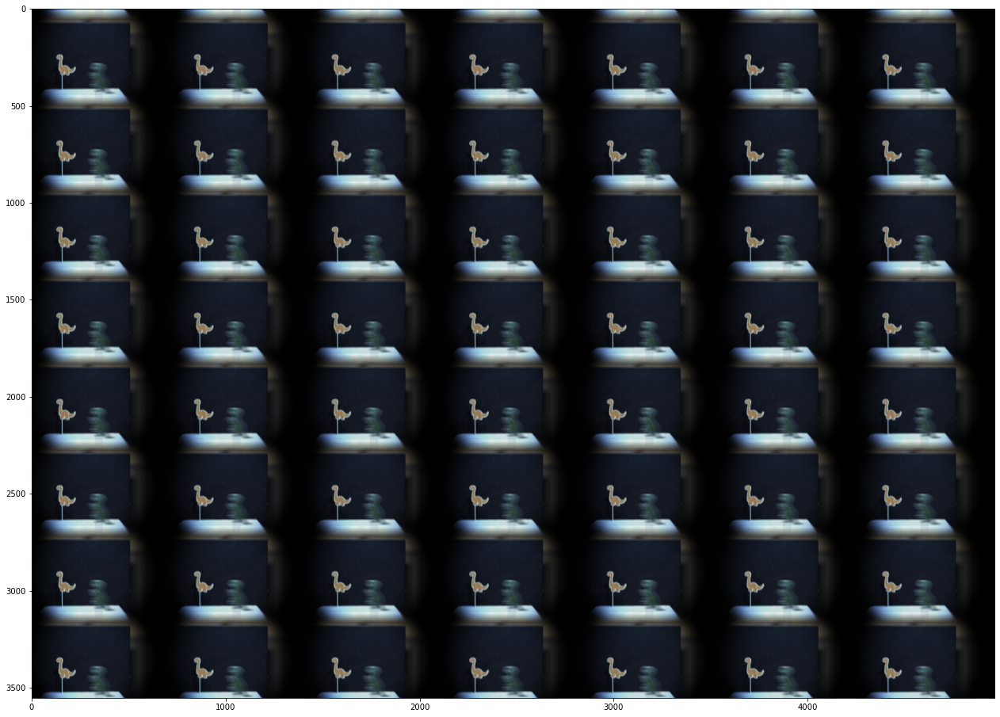

In [471]:
#Paso 3: Filtrar
B_filtrada = frecuencia(B,Tx2,Ty2)
G_filtrada = frecuencia(G,Tx2,Ty2)
R_filtrada = frecuencia(R,Tx2,Ty2)
EIA_filtrada = np.zeros((B_filtrada.shape[0],B_filtrada.shape[1],3),np.uint8)
EIA_filtrada[:,:,0] = R_filtrada
EIA_filtrada[:,:,1] = G_filtrada
EIA_filtrada[:,:,2] = B_filtrada
plt.figure(figsize = (32,16))
plt.imshow(EIA_filtrada,cmap = 'gray')

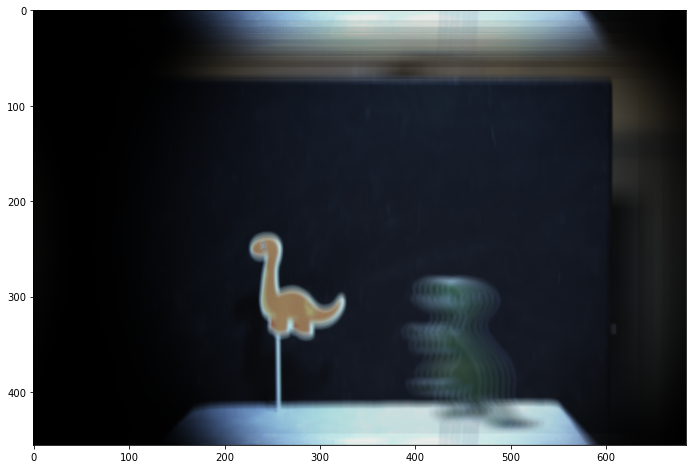

In [472]:
single_filtered = EIA_to_single_EIs(EIA_filtrada,7,7,nx,ny)
plt.figure(figsize = (16,8))
plt.imshow(single_filtered[4],cmap = 'gray')